Accuracy: 0.9595959595959596

Classification Report:
               precision    recall  f1-score   support

         0.0       0.96      1.00      0.98        90
         1.0       1.00      0.56      0.71         9

    accuracy                           0.96        99
   macro avg       0.98      0.78      0.85        99
weighted avg       0.96      0.96      0.95        99



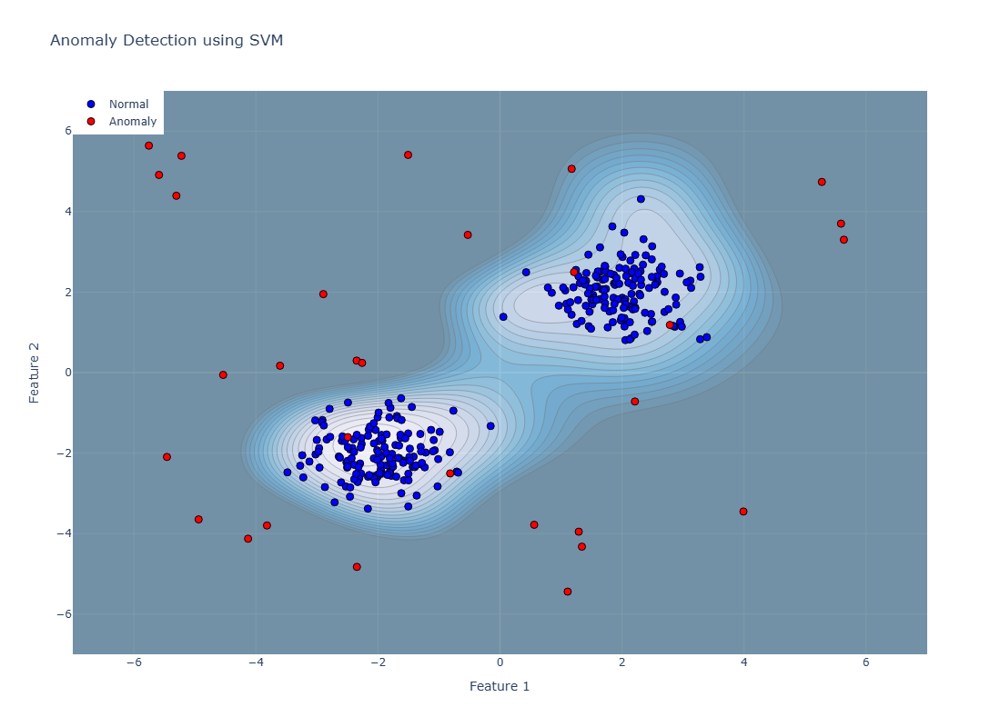

In [3]:
import numpy as np
import plotly.graph_objects as go
from sklearn import svm
from sklearn.datasets import make_blobs
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report

def generate_2d_data(n_samples=300, n_anomalies=30, random_state=42):
    """Generate 2D synthetic data with normal points and anomalies."""
    np.random.seed(random_state)
    # Generate normal points centered around two clusters
    normal_data, _ = make_blobs(n_samples=n_samples, centers=[(2, 2), (-2, -2)], cluster_std=0.6, random_state=random_state)
    # Generate anomalies randomly distributed in the space
    anomalies = np.random.uniform(low=-6, high=6, size=(n_anomalies, 2))
    # Label the data: 0 for normal points, 1 for anomalies
    normal_labels = np.zeros(len(normal_data))
    anomaly_labels = np.ones(len(anomalies))
    # Combine normal data and anomalies
    X = np.vstack([normal_data, anomalies])
    y = np.hstack([normal_labels, anomaly_labels])
    return X, y

def train_svm(X_train, y_train):
    """Train an SVM classifier for anomaly detection."""
    clf = svm.SVC(kernel='rbf', gamma='auto', C=1.0)
    clf.fit(X_train, y_train)
    return clf

def plot_results(X, y, clf, title="Anomaly Detection using SVM"):
    """Plot the data, anomalies, and SVM decision boundary using Plotly."""
    # Create a mesh to plot the decision boundary
    xx, yy = np.meshgrid(np.linspace(-7, 7, 500), np.linspace(-7, 7, 500))
    Z = clf.decision_function(np.c_[xx.ravel(), yy.ravel()])
    Z = Z.reshape(xx.shape)

    # Plot normal points
    normal_points = X[y == 0]
    anomaly_points = X[y == 1]

    # Create a scatter plot for normal points and anomalies
    trace_normal = go.Scatter(
        x=normal_points[:, 0],
        y=normal_points[:, 1],
        mode='markers',
        marker=dict(color='blue', size=8, line=dict(width=1, color='black')),
        name='Normal'
    )

    trace_anomalies = go.Scatter(
        x=anomaly_points[:, 0],
        y=anomaly_points[:, 1],
        mode='markers',
        marker=dict(color='red', size=8, line=dict(width=1, color='black')),
        name='Anomaly'
    )

    # Create a contour plot for the decision boundary
    trace_boundary = go.Contour(
        x=np.linspace(-7, 7, 500),
        y=np.linspace(-7, 7, 500),
        z=Z,
        colorscale='PuBu',
        contours=dict(
            start=Z.min(),
            end=0,
            size=0.1,
            coloring='fill'
        ),
        opacity=0.5,
        showscale=False
    )

    # Create the layout
    layout = go.Layout(
        title=title,
        xaxis=dict(title='Feature 1'),
        yaxis=dict(title='Feature 2'),
        width=800,
        height=800,
        legend=dict(x=0, y=1),
    )

    # Combine all traces
    fig = go.Figure(data=[trace_boundary, trace_normal, trace_anomalies], layout=layout)
    fig.show()

def main():
    # Generate synthetic data
    X, y = generate_2d_data(n_samples=300, n_anomalies=30)

    # Split the data into training and test sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

    # Train the SVM classifier
    clf = train_svm(X_train, y_train)

    # Predict on the test set
    y_pred = clf.predict(X_test)
    print("Accuracy:", accuracy_score(y_test, y_pred))
    print("\nClassification Report:\n", classification_report(y_test, y_pred))

    # Plot the results
    plot_results(X, y, clf)

if __name__ == "__main__":
    main()
